# Periodic orbits

2025-10-25. Use ||u(t) - u(t+T)|| recurrence plots, I vs D phase portraitss, and I(t)
time series to get intial guesses for periodic orbits. Reviewing a single transient
times series from the unstable manifold of EQ1.


**Results:** Found several periodic orbits

| name  | period | (t,T) guess |
|---|--:|---|
| orbit1 |  59.36 | (148,58) |
| orbit2 | 112.08 | (1350,113) |
| orbit3 | 160.06 | (1553, 161) |
| orbit4 | 276.63 | (850,276) |

data is in `/home/gibson/research/algebraic-eqbs/eq1timeseries`

![E3d vs E phase portrait of four periodic orbits](orbits.png)

$L_x, L_z = 2\pi, \pi$, $Re=200$, $\langle \sigma_{xyz}, \sigma_z \tau_{xz} \rangle = \Gamma_E$

In [1]:
using Revise, Polynomials, DelimitedFiles, Plots, LinearAlgebra

#includet("BasisFunctions.jl")

#using .BasisFunctions
#display("text/html", "<style>.container { width:100% !important; }</style>")
pwd()

function myreaddlm(filename)    
    X = readdlm(filename, comments=true, comment_char='%')
    if size(X,2) == 1
        X = X[:,1]
    end
    X
end

LoadError: ArgumentError: Package Revise not found in current path.
- Run `import Pkg; Pkg.add("Revise")` to install the Revise package.

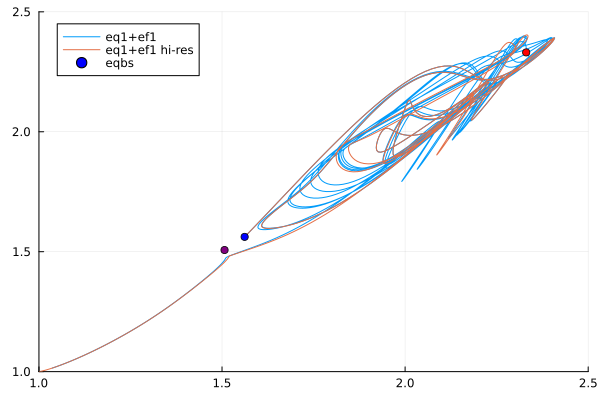

In [2]:
eqbIDE = myreaddlm("eq1timeseries/eqbsIDE.asc")
IDEm = myreaddlm("eq1timeseries/tIDE-eq1-ef1.asc")
IDEp = myreaddlm("eq1timeseries/tIDE-eq1+ef1.asc")
IDEf = myreaddlm("eq1timeseries/tIDE-eq1+ef1-48x49x48.asc")

t,I,D,E,E3d = 1:5

m = E
n = E3d

eqbcolors = [:blue; :red; :purple; :orange]

plot(IDEp[:,2], IDEp[:,3], label="eq1+ef1")
plot!(IDEf[:,2], IDEf[:,3], label="eq1+ef1 hi-res")
scatter!(eqbIDE[:,2], eqbIDE[:,3], color=eqbcolors, label="eqbs")
plot!(xlim=(1,2.5),ylim=(1,2.5))

**Comment:** Look at all the repeated paths, llikely periodic orbits.

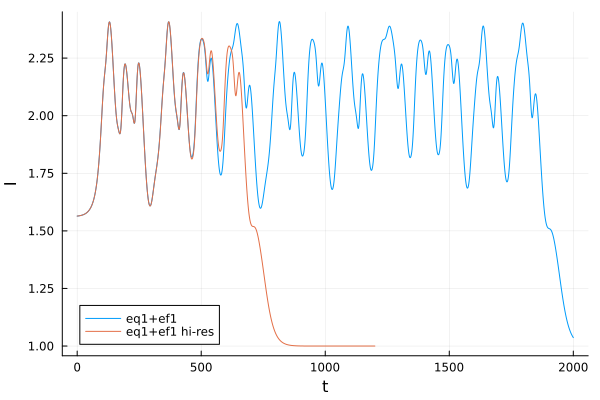

In [3]:
plot(IDEp[:,1], IDEp[:,2], label="eq1+ef1")
plot!(IDEf[:,1], IDEf[:,2], label="eq1+ef1 hi-res")
plot!(xlabel="t", ylabel="I")

In [5]:
dist_1 = myreaddlm("eq1timeseries/eq1+ef1-recurrence-1.asc");
dist_1 = dist_1';

function plotrecurrence(dist, dt=1, dT=1)
    NT,Nt = size(dist)
    t = 1:dt:Nt
    T = 1:dT:NT
    heatmap(t,T,dist[T,t], colormap=:jet)
end

plotrecurrence (generic function with 3 methods)

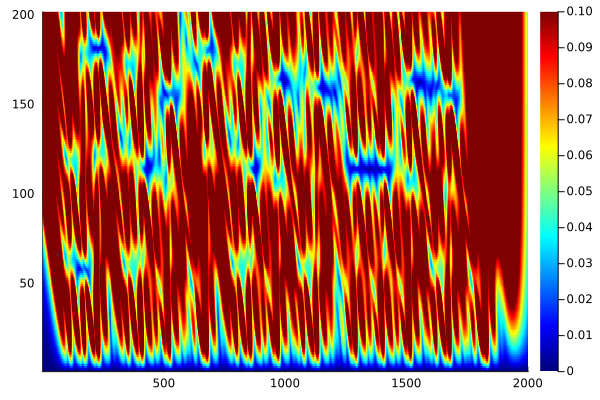

In [6]:
plotrecurrence(dist_1,1,1)
plot!(clim=(0, 0.1))

**Comment:** Blue spots indicate minima of $\|u(t+T) - u(t)\|$, close recurrences
that serve as initial guesses for periodic orbits. 

# Orbit 1: guess t=148, T=58 (converged T=59.36)

Hone in on the first blue spot. 

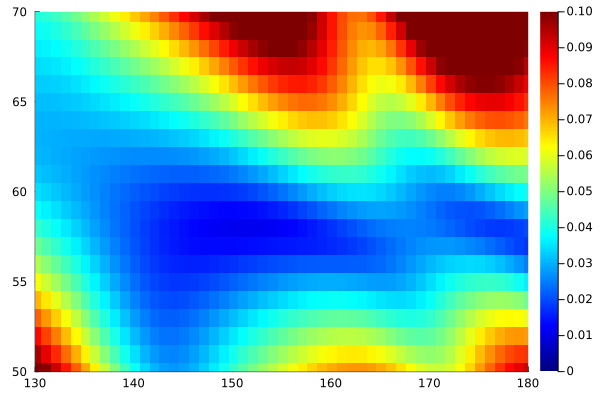

In [7]:
plot!(ylim=(50,70),xlim=(130,180), clim=(0, 0.1))

t=148, T=58 looks like the deepest blue, local minimum. Plot this segment
of the trajectory in I v D. 

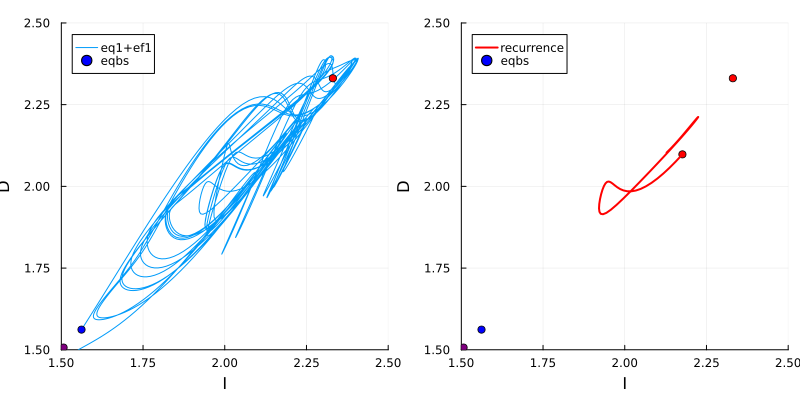

In [10]:

t0 = 148;
T = 58
t = t0:t0+T

plot()

#plot!(IDEm[:,2], IDEm[:,3], label="eq1-ef1")
plot!(IDEp[:,2], IDEp[:,3], label="eq1+ef1")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
scatter!(eqbIDE[:,2], eqbIDE[:,3], color=eqbcolors, label="eqbs")
p1 = plot!(xlabel="I", ylabel="D")

scatter([IDEp[t0,2]], [IDEp[t0,3]], color=:red, label="")
plot!(IDEp[t,2], IDEp[t,3], color=:red, linewidth=2, label="recurrence")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
scatter!(eqbIDE[:,2], eqbIDE[:,3], color=eqbcolors, label="eqbs")
p2 = plot!(xlabel="I", ylabel="D")

plot(p1,p2, size=(800,400))

Computed periodic orbit with channelflow command

`mpirun -n 4 findsoln -np0 4 -np1 1 -orb -R 200 -symms /home/gibson/symms/sxyz-sztxz.asc -T 58 ../origin/data-eq1+ef1/u148`

Period is $T=59.362036059314882$. After it converged, computed orbit as trajectory with 

`simulateflow -np0 4 -np1 1 -R 200 -symms /home/gibson/symms/sxyz-sztxz.asc -T 59 -dT 1.0061362043951674 -o data ubest.nc`

$dT = T/59 = 1.0061362043951674$ is the interval for saving $u$ to disk. This choice ensures the final timestep lands exactly on the first. 16 digits is beyond the precision of the calculation, but it is still worth doing, IMHO, for checking $u(t+T) = u(t)$ and being able to compute averages over orbit with $N$ points evenly divided in time. 

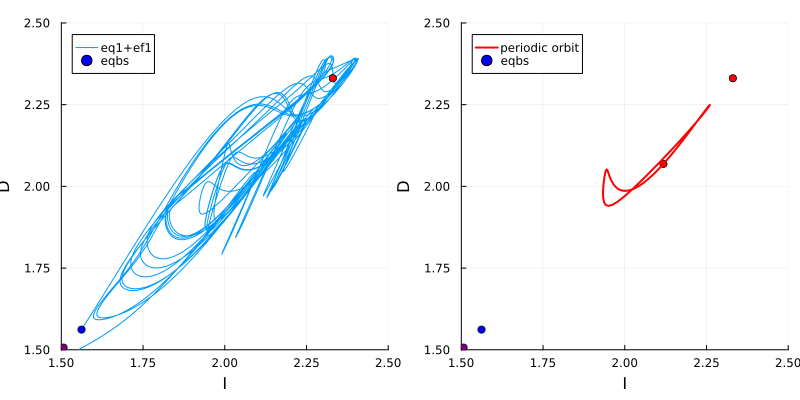

In [24]:
orb1 = myreaddlm("eq1timeseries/findsoln-148-58/data/tIDE.asc")
orb1 = orb1[1:60,:]

scatter([orb1[1,2]], [orb1[1,3]], color=:red, label="")
plot!(orb1[:,2], orb1[:,3], color=:red, linewidth=2, label="periodic orbit")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
scatter!(eqbIDE[:,2], eqbIDE[:,3], color=eqbcolors, label="eqbs")
p2 = plot!(xlabel="I", ylabel="D")

plot(p1,p2, size=(800,400))

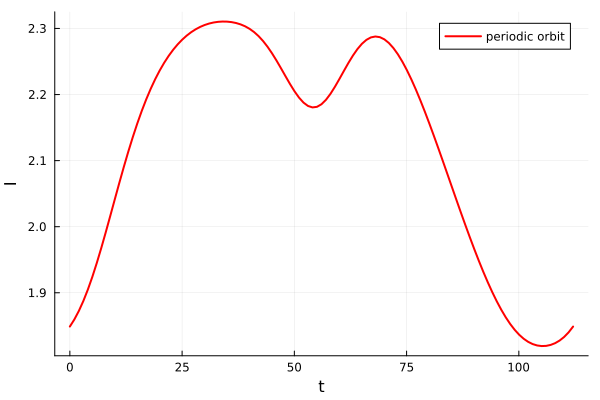

In [25]:
plot(orb[:,1], orb[:,2], color=:red, linewidth=2, label="periodic orbit")
plot!(xlabel="t", ylabel="I")

# Orbit 2: t=1350, T=113

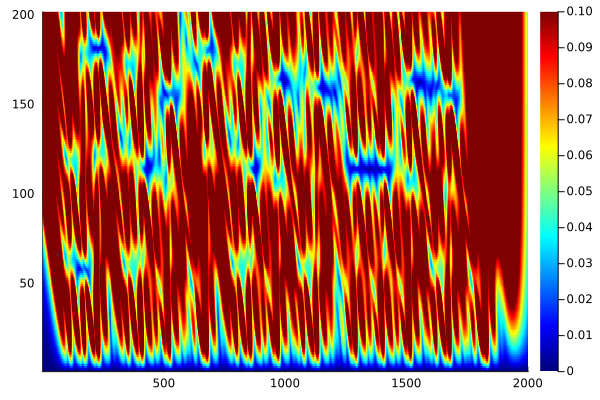

In [13]:
plotrecurrence(dist_1,1,1)
plot!(clim=(0, 0.1))
#plot!(xlim=(1300,1500),xlim=(130,180), clim=(0, 0.1))

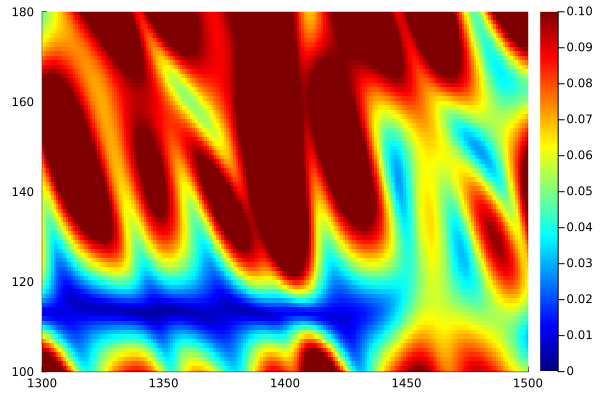

In [14]:
plot!(xlim=(1300,1500), ylim=(100,180), clim=(0, 0.1))

In [15]:
dist_1[110:120,1350:1355]

11×6 Matrix{Float64}:
 0.01543   0.01696   0.01849   0.01983   0.0209    0.02164
 0.01221   0.01341   0.01448   0.01536   0.01598   0.01634
 0.008708  0.009452  0.01006   0.01049   0.01074   0.01081
 0.005176  0.005384  0.005516  0.005575  0.00557   0.005516
 0.003606  0.003444  0.003396  0.003475  0.003673  0.003969
 0.006807  0.007092  0.007469  0.00789   0.008322  0.008745
 0.01173   0.01241   0.01307   0.01366   0.01416   0.01456
 0.01718   0.01814   0.01897   0.01964   0.02013   0.02046
 0.02289   0.02404   0.02496   0.02563   0.02605   0.02627
 0.02873   0.02998   0.03091   0.03153   0.03185   0.03191
 0.03459   0.03587   0.03677   0.03728   0.03746   0.03734

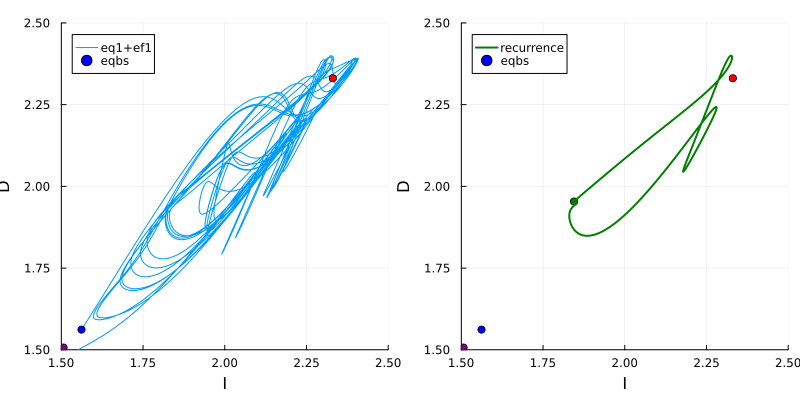

In [26]:
t0 = 1350;
T = 113
t = t0:t0+T

plot()

scatter([IDEp[t0,2]], [IDEp[t0,3]], color=:green, label="")
plot!(IDEp[t,2], IDEp[t,3], color=:green, linewidth=2, label="recurrence")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
scatter!(eqbIDE[:,2], eqbIDE[:,3], color=eqbcolors, label="eqbs")
p2 = plot!(xlabel="I", ylabel="D")

plot(p1,p2, size=(800,400))

Found a periodic orbit with a few channelflow computations. Regular shooting method wasn't converging
so I did multishooting on stalled prior results

`findsoln -np0 4 -np1 1 -orb --Nshots 2 -R 200 -d 0.002 -eg 1e-05 -symms /home/gibson/symms/sxyz-sztxz.asc -T ../findsoln-1350-113b/Tbest.asc ../findsoln-1350-113b/ubest.nc`

In [18]:
dT = 112.0843303475679/112

1.0007529495318563

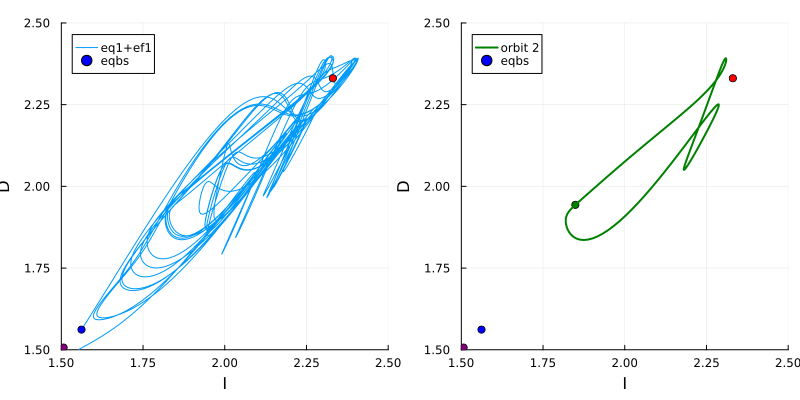

In [27]:
orb2 = myreaddlm("eq1timeseries/findsoln-1350-113c/data/tIDE.asc")
orb = orb2

scatter([orb[1,2]], [orb[1,3]], color=:green, label="")
plot!(orb[:,2], orb[:,3], color=:green, linewidth=2, label="orbit 2")
scatter!(eqbIDE[:,2], eqbIDE[:,3], color=eqbcolors, label="eqbs")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
p2 = plot!(xlabel="I", ylabel="D")

plot(p1,p2, size=(800,400))

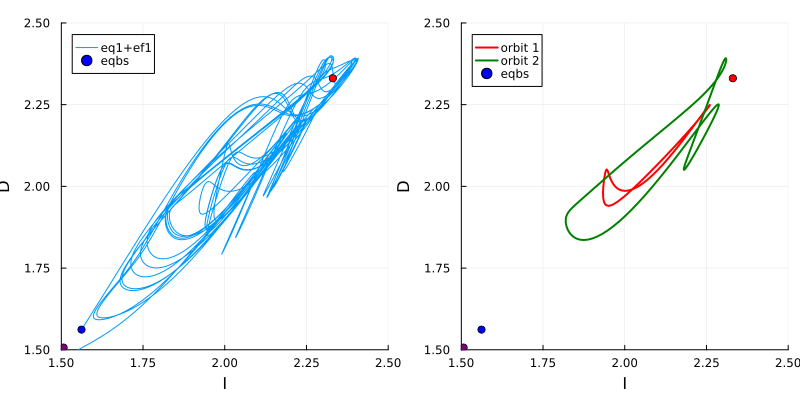

In [28]:
plot(orb1[:,2], orb1[:,3], color=:red, linewidth=2, label="orbit 1")
plot!(orb2[:,2], orb2[:,3], color=:green, linewidth=2, label="orbit 2")
scatter!(eqbIDE[:,2], eqbIDE[:,3], color=eqbcolors, label="eqbs")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)

pall = plot!(xlabel="I", ylabel="D")

plot(p1,pall,size=(800,400))

# Orbit 3: t=1553, T=161

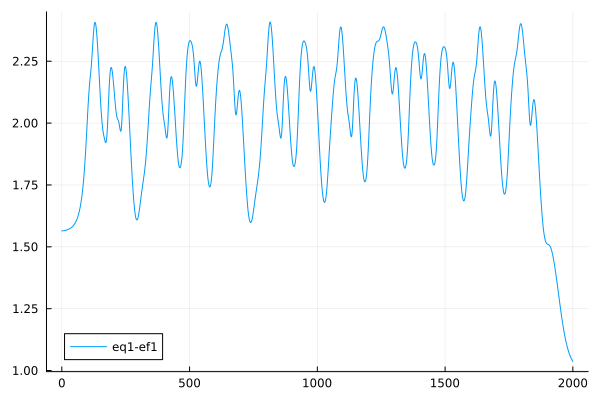

In [29]:
plot(IDEp[:,1], IDEp[:,2], label="eq1-ef1")

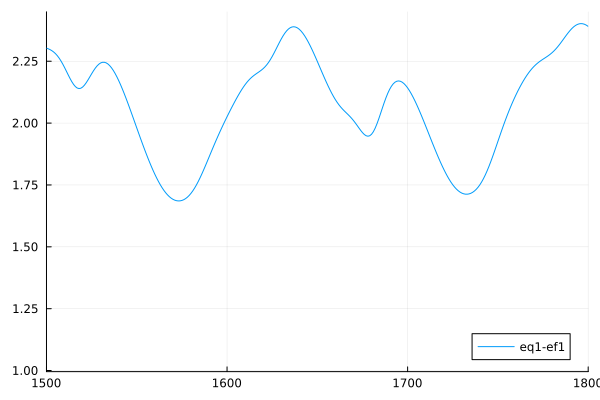

In [30]:
plot!(xlim=(1500,1800))

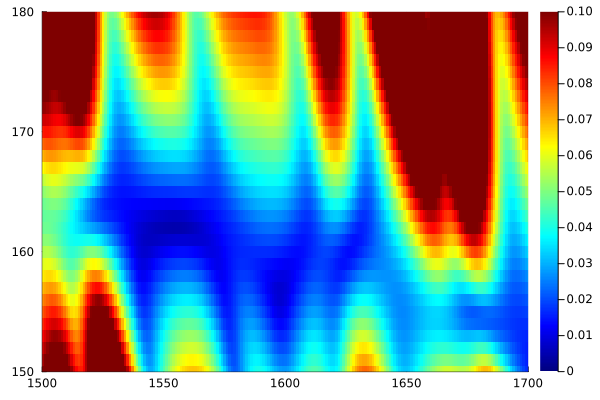

In [31]:
plotrecurrence(dist_1,1,1)
plot!(xlim=(1500,1700), ylim=(150,180), clim=(0, 0.1))
#plot!(xlim=(1300,1500),xlim=(130,180), clim=(0, 0.1))

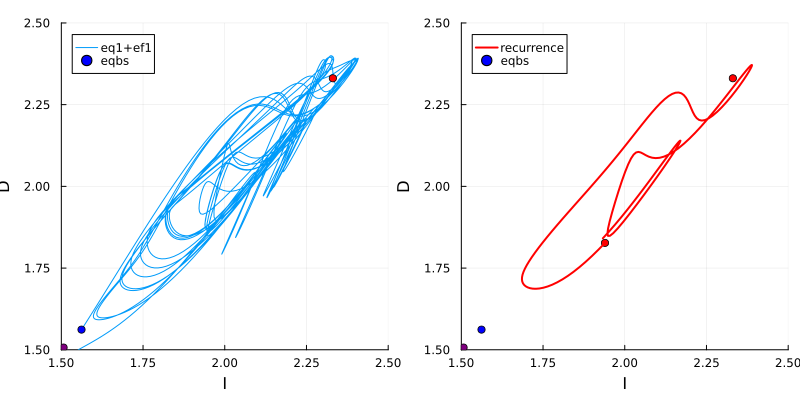

In [32]:
t0 = 1553;
T = 161
t = t0:t0+T

scatter([IDEp[t0,2]], [IDEp[t0,3]], color=:red, label="")
plot!(IDEp[t,2], IDEp[t,3], color=:red, linewidth=2, label="recurrence")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
#plot!(IDEm[:,2], IDEm[:,3], label="eq1-ef1")
scatter!(eqbIDE[:,2], eqbIDE[:,3], color=eqbcolors, label="eqbs")

p2 = plot!(xlabel="I", ylabel="D")
plot(p1,p2, size=(800,400))

In [33]:
160.06397011891264/160

1.000399813243204

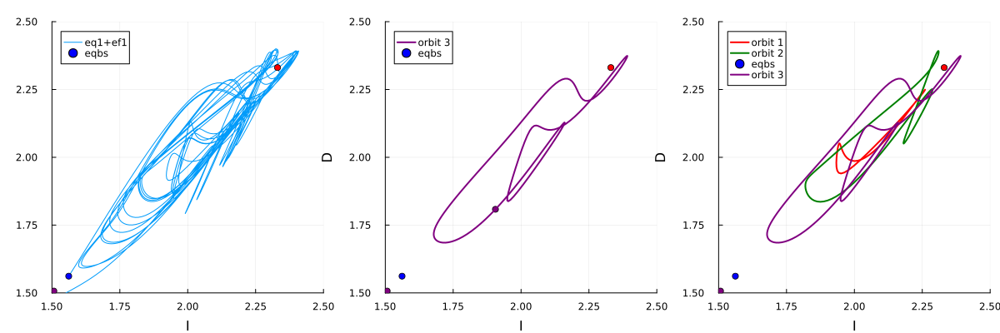

In [34]:
orb3 = myreaddlm("eq1timeseries/findsoln-1553-162/data/tIDE.asc")

scatter([orb3[1,2]], [orb3[1,3]], color=:purple, label="")
plot!(orb3[:,2], orb3[:,3], color=:purple, linewidth=2, label="orbit 3")
scatter!(eqbIDE[:,2], eqbIDE[:,3], color=eqbcolors, label="eqbs")

plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
p3 = plot!(xlabel="I", ylabel="D")


plot(pall)
pall = plot!(orb3[:,2], orb3[:,3], color=:purple, linewidth=2, label="orbit 3")
plot(p1,p3, pall, size=(1200,400), layout=(1,3))

# Orbit 4: 850-276

Initial guess t=850, T=276. Converged to T=276.63 orbit. Used multishooting, 4 shots. 

In [35]:
276.62958162951338/276

1.0022810928605557

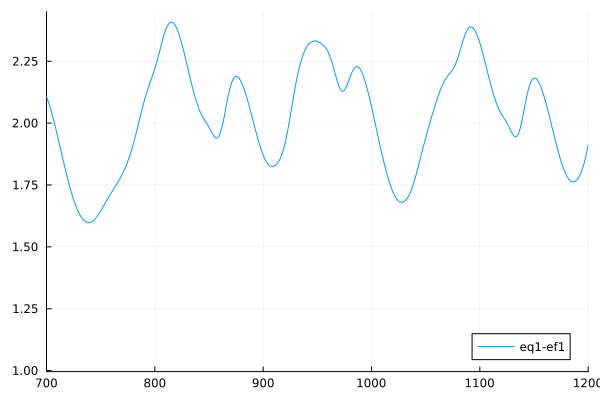

In [37]:
plot(IDEp[:,1], IDEp[:,2], label="eq1-ef1")
plot!(xlim=(700,1200))

T = 276


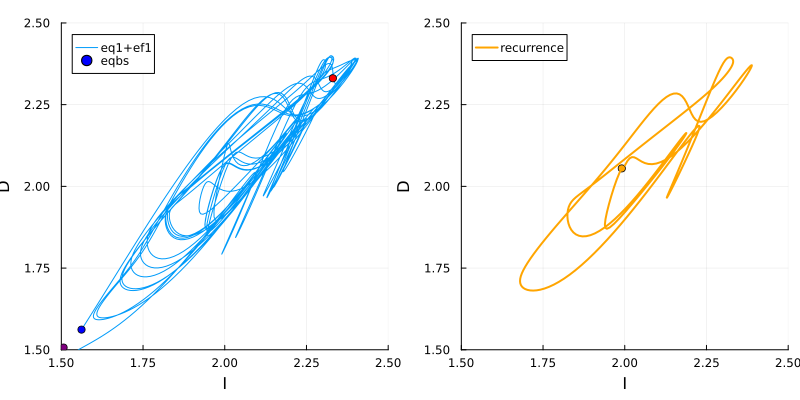

In [38]:
t0 = 850;
t1 = 1126
t = t0:t1
T = t1-t0
@show T


scatter([IDEp[t[1],2]], [IDEp[t[1],3]], color=:orange, label="")
plot!(IDEp[t,2], IDEp[t,3], color=:orange, linewidth=2, label="recurrence")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
p2 = plot!(xlabel="I", ylabel="D")

plot(p1,p2, size=(800,400))

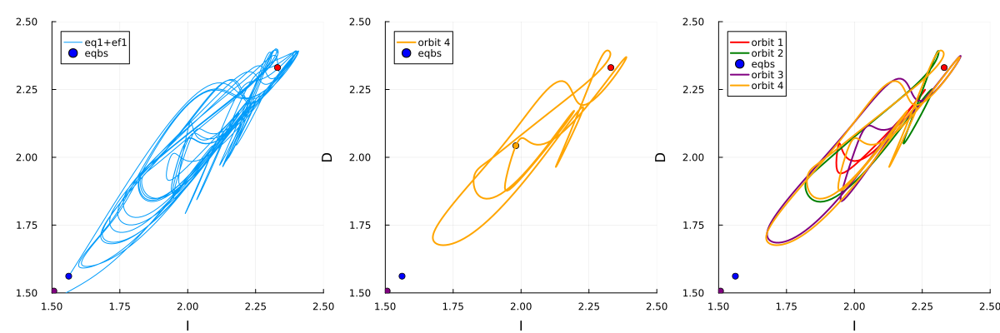

In [39]:
orb4 = myreaddlm("eq1timeseries/findsoln-850-276/data/tIDE.asc")

scatter([orb4[1,2]], [orb4[1,3]], color=:orange, label="")
plot!(orb4[:,2], orb4[:,3], color=:orange, linewidth=2, label="orbit 4")
scatter!(eqbIDE[:,2], eqbIDE[:,3], color=eqbcolors, label="eqbs")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
p4 = plot!(xlabel="I", ylabel="D")


plot(pall)
pall = plot!(orb4[:,2], orb4[:,3], color=:orange, linewidth=2, label="orbit 4")
plot(p1,p4, pall, size=(1200,400), layout=(1,3))

## All four orbits together

Plot in E vs E3d.

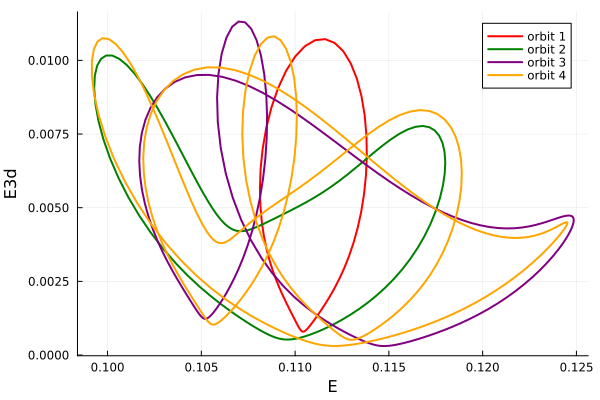

In [41]:
m = 4
n = 5 

labels = ["t"; "I"; "D"; "E"; "E3d"]
eqbcolors = [:blue; :red; :purple; :orange]

plot()
plot!(orb1[1:60,m], orb1[1:60,n], color=:red, linewidth=2, label="orbit 1")
plot!(orb2[:,m], orb2[:,n], color=:green, linewidth=2, label="orbit 2")
plot!(orb3[:,m], orb3[:,n], color=:purple, linewidth=2, label="orbit 3")
plot!(orb4[:,m], orb4[:,n], color=:orange, linewidth=2, label="orbit 4")
plot!(xlabel=labels[m], ylabel=labels[n])
pall=plot!()
#pall = scatter!(eqbIDE[:,m], eqbIDE[:,n], color=eqbcolors, label="eqbs")

In [42]:
savefig("orbits.png")

"/home/gibson/research/algebraic-eqbs/orbits.png"

# Here on is incomplete

# Orbit t=100, T=239

In [ ]:
plot(IDEp[:,1], IDEp[:,2], label="eq1+ef1")

In [ ]:
plot!(xlim=(0,400))

In [ ]:
t0 = 100
T = 239
t = t0:t0+T
#T = t1-t0
@show T

plot()

#plot!(IDEm[:,2], IDEm[:,3], label="eq1-ef1")
plot!(IDEp[:,m], IDEp[:,n], label="eq1+ef1")
scatter!(eqbIDE[:,m], eqbIDE[:,n], color=eqbcolors, label="eqbs")
#plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
p1 = plot!()

scatter([IDEp[t[1],m]], [IDEp[t[1],n]], color=:brown, label="")
plot!(IDEp[t,m], IDEp[t,n], color=:brown, linewidth=2, label="recurrence")
#plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
p2 = plot!()

plot(p1,p2, pall, size=(1200,400), layout=(1,3))

# Orbit t=312, T=447

In [ ]:
plot(IDEp[:,1], IDEp[:,m], label="eq1+ef1")

In [ ]:
plot!(xlim=(200,800))

In [ ]:
t0 = 312;
T = 447
t = t0:t0+T

plot()

#plot!(IDEm[:,2], IDEm[:,3], label="eq1-ef1")
plot!(IDEp[:,2], IDEp[:,3], label="eq1+ef1")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
p1 = plot!(xlabel="I", ylabel="D")

scatter([IDEp[t0,2]], [IDEp[t0,3]], color=:red, label="")
plot!(IDEp[t,2], IDEp[t,3], color=:red, linewidth=2, label="recurrence")
plot!(xlim=(1.5,2.5), ylim=(1.5,2.5), aspect_ratio=:equal)
p2 = plot!(xlabel="I", ylabel="D")

plot(p1,p2, size=(800,400))

In [ ]:
dist_tx = myreaddlm("eq1timeseries/eq1+ef1-recurrence-tx.asc")'
dist_tz = myreaddlm("eq1timeseries/eq1+ef1-recurrence-tz.asc")'
dist_txz = myreaddlm("eq1timeseries/eq1+ef1-recurrence-txz.asc")';

In [ ]:
IDEorbit = myreaddlm("eq1timeseries/findsoln-148-58/data/tIDE.asc")

plot(IDEm[:,2], IDEm[:,3], label="eq1-ef1")
plot!(IDEp[:,2], IDEp[:,3], label="eq1+ef1")
plot!(xlabel="I", ylabel="D")

plot!(IDEorbit[:,2], IDEorbit[:,3], linewidth=2, label="periodic orbit")

# Detritus

## Solve for eqb using hookstep

In [ ]:
includet("Hookstep.jl")

using .Hookstep

In [ ]:

x,X = hookstepsolve(f, xproj, verbose=false)

In [ ]:
save(x, datadir*"xodeeqb-Re300d-80d-from-projection.asc")

In [ ]:
x[1:10]

In [ ]:
xproj[1:10]

In [ ]:
norm(xproj)

## Find eqbs using fuzzing

In [ ]:
Nfuzz = 100
xnorm = 0.40

Xguess = fill(x, 0)
Xsoln = fill(x, 0)
for i in 1:Nfuzz
    print("$i ")
    xguess = randn(Nmodes)
    xguess = xnorm/norm(xguess) * xguess
       
    xsoln,X = hookstepsolve(f, Df, xguess, verbose=false)
    
    if norm(xsoln) > 1e-02 && norm(f(xsoln)) < 1e-07
        println("found one")
        push!(Xguess, xguess)
        push!(Xsoln, xsoln)
    end
end
[norm(Xsoln[i]) for i in 1:length(Xsoln)]

In [ ]:
Xsoln[2]

In [ ]:
save(Xsoln[1], datadir*"xodeeqb-Re300-80d-1.asc")
save(Xsoln[2], datadir*"xodeeqb-Re300-80d-2.asc")
#save(Xsoln[7], datadir*"xodeeqb-Re300-28d-3.asc")

In [ ]:
x, X = hookstepsolve(f, Df, Xsoln[2], verbose=false)
x

In [ ]:
Xnorm = [norm(Xsoln[i,:]) for i in 1:Nfuzz]

In [ ]:
using LinearAlgebra 

Df = inv(B)*(Af + derivative(Nf, x))

In [ ]:
λode = eigvals(Df)

In [ ]:
scatter(λode)

In [ ]:
show(stdout, "text/plain", ans)

In [ ]:
typeof(X)

In [ ]:
norm(x-xproj)/norm(xproj)

In [ ]:
xproj[1:10]

In [ ]:
x[1:10]

In [ ]:
using Plots

scatter(xproj[1:30], label="xproj")
scatter!(x[1:30], label="xode")

In [ ]:
show(stdout, "text/plain", ans)